## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
---

In [1]:
#Importing necessary libraries
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches
import glob
import cv2
import os

### Computing Camera Calibration Matrix and Distortion Coefficients

Finding and Drawing Chessboard Corners

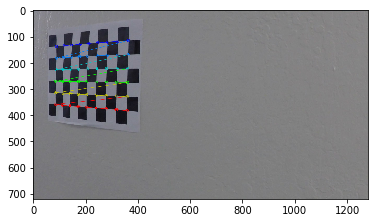

In [2]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Make a list of calibration images
files = os.listdir('camera_cal')

# Step through the list and search for chessboard corners
for fname in files:
    if fname.startswith('calibration'):
        img = mpimg.imread('camera_cal/'+fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If found, add object points, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)                
            
            # Save the image
            plt.imsave('./output_images/ChessboardCorners/'+fname, img)


# Display the last image with Chessboard corners drawn
plt.imshow(img)

Camera Calibration and Undistortion

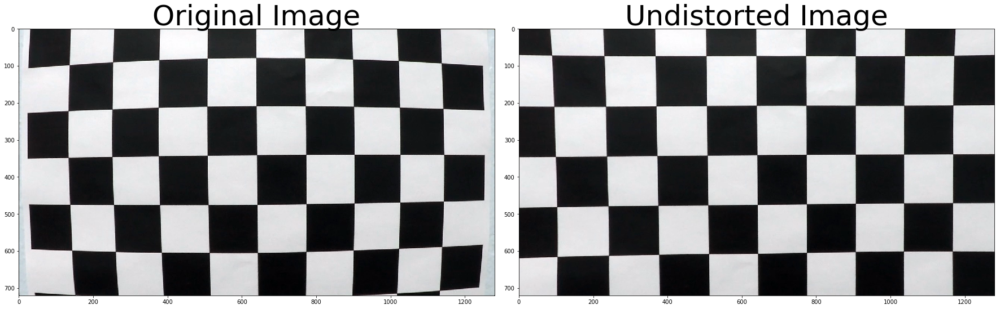

In [3]:
#Read any one of calibration images and apply cv2.calibrateCamera() and cv2.undistort() functions
img = cv2.imread('./camera_cal/calibration1.jpg')
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
undist = cv2.undistort(img, mtx, dist, None, mtx)

#Display original image and undistorted image side by side
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist, cmap='gray')
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [4]:
# print calibration matrix and distortion coefficients found
print('Calibration Matrix:\n {},\n\n Distortion Coefficients:\n {}'.format(mtx, dist))

Calibration Matrix:
 [[  1.15662906e+03   0.00000000e+00   6.69041437e+02]
 [  0.00000000e+00   1.15169194e+03   3.88137240e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]],

 Distortion Coefficients:
 [[-0.2315715  -0.12000537 -0.00118338  0.00023305  0.15641571]]


<b>Helper Functions</b>

In [5]:
def abs_sobel_thresh(img, orient='x', thresh_min=5, thresh_max=100):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
        abs_sobel = np.abs(sobelx)
    if orient == 'y':
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        abs_sobel = np.abs(sobely)
    # 3) Take the absolute value of the derivative or gradient
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobel_scaled = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(sobel_scaled)
    binary_output[(sobel_scaled >= thresh_min) & (sobel_scaled <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def color_threshold(img, sthresh=(0, 255), vthresh=(0,255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel <= sthresh[1])] = 1
    
    # 1) Convert to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # 2) Apply a threshold to the S channel
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel <= vthresh[1])] = 1
    
    # 3) Return a binary image of threshold result
    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    return output

def window_mask(width, height, img_ref, center, level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height), max(0,int(center-width)):min(int(center+width), img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, width, height, ym, xm, margin, smooth_factor):
    window_centroids = []    # Store the (left,right) window centroid positions per level
    window = np.ones(width)  # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum
    # to get the vertical image slice and then np.convolve the vertical image slice with 
    # the window template 
    
    # Sum quarter bottom of image to get slice
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window, r_sum))-width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center, r_center))
  
    # Go through each layer looking for max pixel locations
    for level in range(1, (int)(warped.shape[0]/height)):
        # convolve the window into vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*height):int(warped.shape[0]-level*height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right 
        # side of window, not center of window
        offset = width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin, warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin, warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    recent_centers.append(window_centroids)
    return np.average(recent_centers[-smooth_factor:], axis=0)

def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

In [6]:
# Make a list of test images
files = os.listdir('test_images')
files

['test4.jpg',
 'test1.jpg',
 'test2.jpg',
 'straight_lines2.jpg',
 'test3.jpg',
 'straight_lines1.jpg',
 'test6.jpg',
 'test5.jpg']

### Creation of pipeline

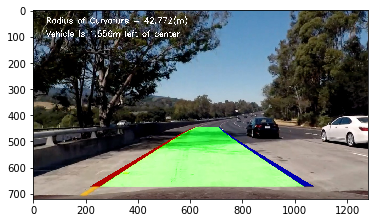

In [7]:
# Loop through each given image
for fname in files:
    if(fname.startswith('test')):
        #Read in the image
        image = plt.imread('test_images/'+fname)
        
        ### Apply undistortion ###
        
        img = cv2.undistort(image, mtx, dist, None, mtx)
        # Save the undistorted image
        plt.imsave('./output_images/Undistorted/'+fname, img)
        
        ### Apply Gradient and Color transformations to create binary image ###
        
        gradx_binary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
        grady_binary = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
        c_binary = color_threshold(img, sthresh=(100,255), vthresh=(50,255))
        # combine them to generate binary image
        combined_binary = np.zeros_like(img[:,:,0])
        combined_binary[(gradx_binary == 1) & (grady_binary == 1) | (c_binary == 1)] = 255
        # Save the binary image
        plt.imsave('./output_images/ThresholdedBinary/'+fname, combined_binary, cmap='gray')
        
        ### Apply Perspective Transformation to the image to get birds-eye view ###
        
        # Define trapezoid measurements of the vehicle camera view
        bot_width = .76                          # Width of the bottom
        mid_width = .08                          # Width of the middle trapezoid
        height_pct = .62                         # Trapezoid height - Percentage of image height
        bottom_trim = .935                       # Bottom trim to avoid car hood in the image
        img_size = (img.shape[1], img.shape[0])  # Shape of the image
        offset = img_size[0]*.25                 # offset to adjust destination view
        # Define 4 source points src = np.float32([[,],[,],[,],[,]])
        src = np.float32([[img.shape[1]*(.5-mid_width/2), img.shape[0]*height_pct],\
                          [img.shape[1]*(.5+mid_width/2),img.shape[0]*height_pct],\
                          [img.shape[1]*(.5+bot_width/2),img.shape[0]*bottom_trim],\
                          [img.shape[1]*(.5-bot_width/2),img.shape[0]*bottom_trim]])
        # Define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        des = np.float32([[offset,0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
        # Apply cv2.getPerspectiveTransform() to get M, the transform matrix and Minv, the inverse transformation matrix
        M = cv2.getPerspectiveTransform(src, des)
        Minv = cv2.getPerspectiveTransform(des, src) # reverse transformation for later use
        # Apply cv2.warpPerspective() to warp the image to a birds-eye view
        warped = cv2.warpPerspective(combined_binary, M, img_size, flags=cv2.INTER_LINEAR)
        # Save the warped image
        plt.imsave('./output_images/Birds-eyeView/'+fname, warped, cmap='gray')
        
        ### Finding pixels using convolving sliding windows ###
        
        # Defining sliding window measurements
        width = 25          # Sliding window width
        height = 80         # Sliding window height
        margin = 25         # How much to slide left and right for searching
        ym = 10/720         # pixels in meters on y-axis         
        xm = 4/384          # pixels in meters on x-axis
        smooth_factor=15    # Smoothing factor to average the last few window centroids
        # Empty list to hold last few window centroids to apply smoothing
        recent_centers = []
        # Find_window_centroids is a function that returns list of window centroids
        window_centroids = find_window_centroids(warped, width, height, ym, xm, margin, smooth_factor)
        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)
        # Points used to find the left and right lanes
        rightx = []
        leftx = []
        # Go through each level and draw the windows
        for level in range(0, len(window_centroids)):
            #window_mask is a function to draw window areas
            l_mask = window_mask(width, height, warped, window_centroids[level][0], level)
            r_mask = window_mask(width, height, warped, window_centroids[level][1], level)
            # Separate left and right window centroids
            leftx.append(window_centroids[level][0])
            rightx.append(window_centroids[level][1])
            # Add graphic points from window mask here to total pixels found
            l_points[(l_points == 255) | ((l_mask == 1))] = 255
            r_points[(r_points == 255) | ((r_mask == 1))] = 255
        #Draw the results
        template = np.array(r_points+l_points, np.uint8)  # add both left and right window pixels together
        zero_channel = np.zeros_like(template)  # create a zero color channel
        template = np.array(cv2.merge((zero_channel, template, zero_channel)), np.uint8)  # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)), np.uint8)  # making the original road pixels 3 color channels
        result = cv2.addWeighted(warpage, 1, template, 0.5, 0.0)  # overlay the orignal road image with window results
        # Save the image with sliding windows
        plt.imsave('./output_images/SlidingWindows/'+fname, result)
        
        ### Fitting Lane Lines ###
        
        yvals = range(0, warped.shape[0])
        res_yvals = np.arange(warped.shape[0]-(height/2),0,-height)
        # Fit a second order polynomial with np.polyfit()
        left_fit = np.polyfit(res_yvals, leftx, 2)
        right_fit = np.polyfit(res_yvals, rightx, 2)
        # Calculate left and right polynomials using yvals, left_fit and right_fit
        left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
        left_fitx = np.array(left_fitx, np.int32)        
        right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
        right_fitx = np.array(right_fitx, np.int32)
        # Find the left and right lanes
        left_lane=np.array(list(zip(np.concatenate((left_fitx-width/2,left_fitx[::-1]+width/2), axis=0), np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
        right_lane=np.array(list(zip(np.concatenate((right_fitx-width/2,right_fitx[::-1]+width/2), axis=0), np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
        inner_lane=np.array(list(zip(np.concatenate((left_fitx+width/2,right_fitx[::-1]-width/2), axis=0), np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
        # Draw the left and right lanes on road with cv2.fillpoly()
        road = np.zeros_like(img)
        road_bkg = np.zeros_like(img)
        cv2.fillPoly(road,[left_lane], color=[255,0,0])
        cv2.fillPoly(road,[right_lane], color=[0,0,255])
        cv2.fillPoly(road,[inner_lane], color=[0,255,0])
        cv2.fillPoly(road_bkg,[left_lane], color=[255,255,255])
        cv2.fillPoly(road_bkg,[right_lane], color=[255,255,255])
        # Plot the identified lane lines on the original image
        road_warped = cv2.warpPerspective(road, Minv, img_size, flags=cv2.INTER_LINEAR)
        road_warped_bkg = cv2.warpPerspective(road_bkg, Minv, img_size, flags=cv2.INTER_LINEAR)
        # Combine both road and road background images
        base = cv2.addWeighted(img, 1.0, road_warped_bkg, -1.0, 0.0)
        result = cv2.addWeighted(base, 1.0, road_warped, 0.7, 0.0)
        # Save the image with lane lines drawn
        plt.imsave('./output_images/LaneLines/'+fname, result)
        
        ### Finding radius of curvature ###
        
        curve_fit_cr = np.polyfit(np.array(res_yvals,np.float32)*ym, np.array(leftx,np.float32)*xm, 2)
        curverad = ((1 + (2*curve_fit_cr[0]*yvals[-1]*ym + curve_fit_cr[1])**2)**1.5) / np.absolute(2*curve_fit_cr[0])
        #Calculate the offset of the center
        camera_center = (left_fit[-1] + right_fit[-1])/2
        center_diff = (camera_center - warped.shape[1]/2)*xm
        side_pos='left'
        if(center_diff <= 0):
            side_pos='right'
        
        ### Draw the text showing curvature, offset and speed ###
        
        cv2.putText(result, 'Radius of Curvature = '+str(round(curverad, 3))+'(m)',(50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
        cv2.putText(result, 'Vehicle is '+str(abs(round(center_diff,3)))+'m '+side_pos+' of center',(50,100), cv2.FONT_HERSHEY_SIMPLEX,1, (255,255,255),2)
        # Save the final output image 
        plt.imsave('./output_images/Curvature/'+fname, result)
        
        # Display the final output here
        plt.imshow(result)

In [8]:
print('src: {}\n, des: {}'.format(src, des))

src: [[  588.79998779   446.3999939 ]
 [  691.20001221   446.3999939 ]
 [ 1126.40002441   673.20001221]
 [  153.6000061    673.20001221]]
, des: [[ 320.    0.]
 [ 960.    0.]
 [ 960.  720.]
 [ 320.  720.]]


### Check the images from pipeline

<b>Undistorted Images</b>

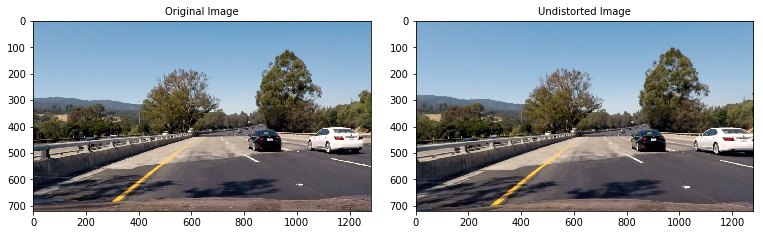

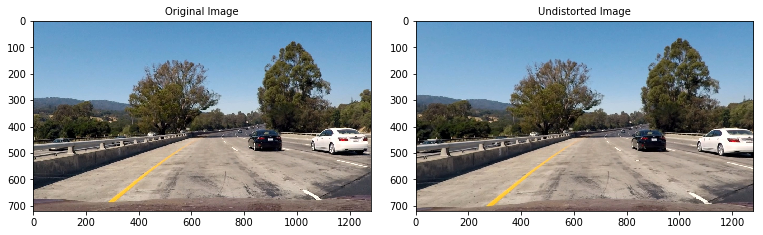

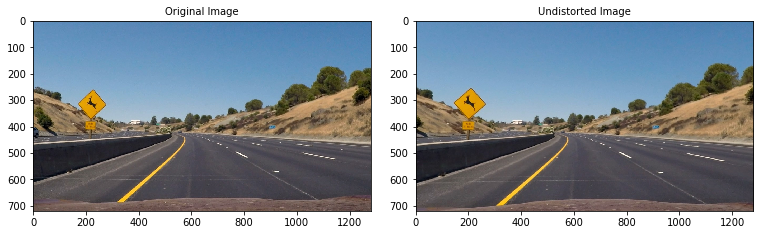

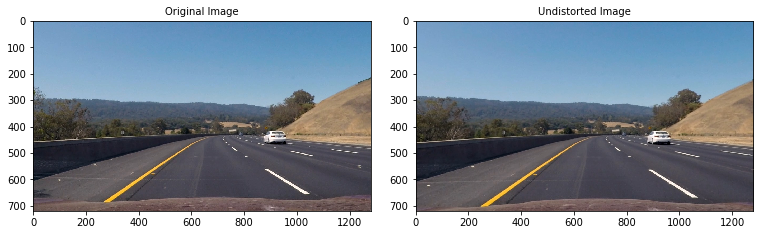

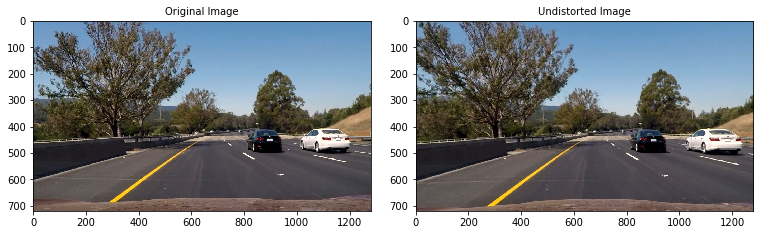

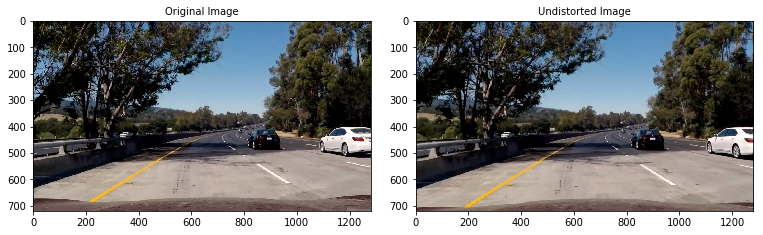

In [9]:
for fname in files:
    if(fname.startswith('test')):
        # Read the image
        img = plt.imread('test_images/'+fname)
        
        # Check the undistorted images
        undist = plt.imread('output_images/Undistorted/'+fname)
        
        #Display original image and undistorted image side by side
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=10)
        ax2.imshow(undist)
        ax2.set_title('Undistorted Image', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)   

<b>Binary Images</b>

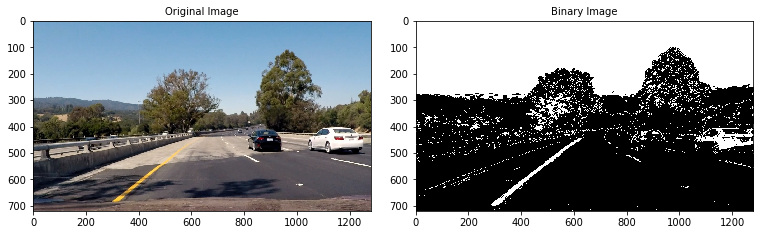

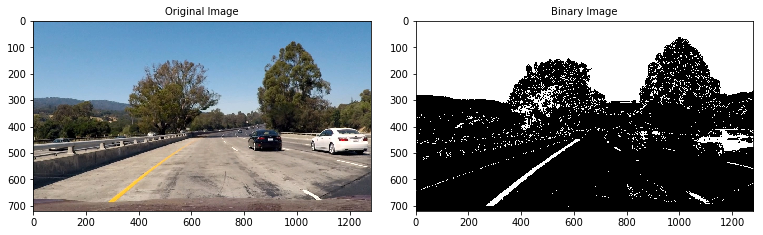

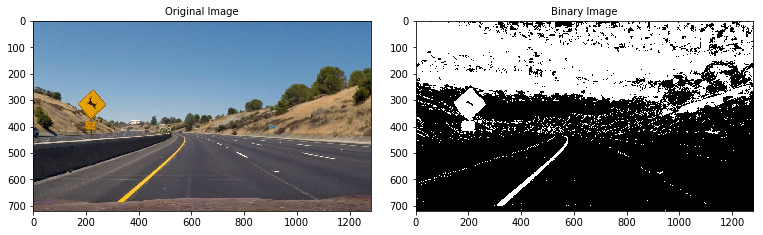

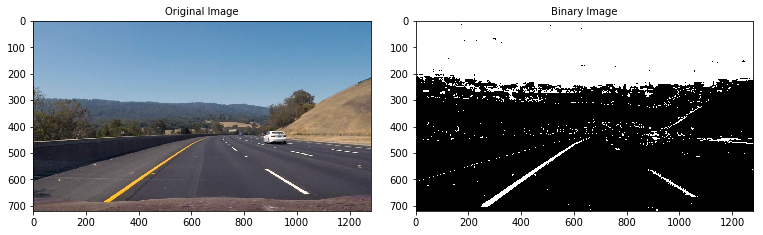

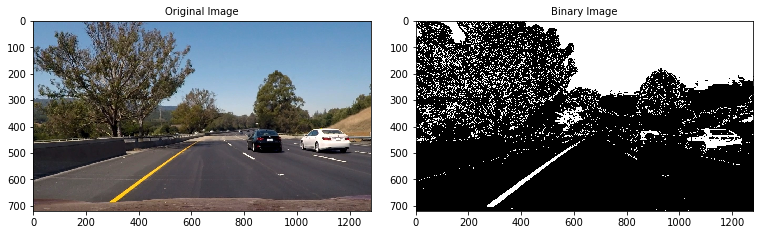

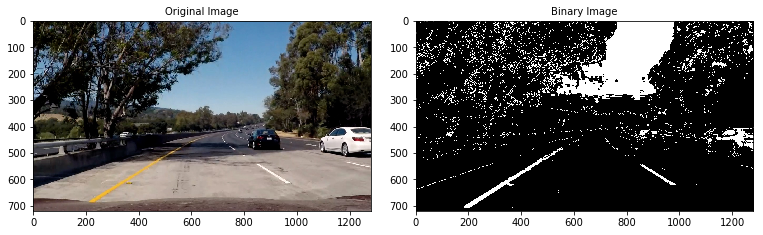

In [10]:
for fname in files:
    if(fname.startswith('test')):
        # Read the image
        img = plt.imread('test_images/'+fname)
        
        # Check the binary images
        binary = cv2.imread('output_images/ThresholdedBinary/'+fname, 0)
        
        #Display original image and undistorted image side by side
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=10)
        ax2.imshow(binary, cmap='gray')
        ax2.set_title('Binary Image', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

<b>Perspective Transformed Images</b>

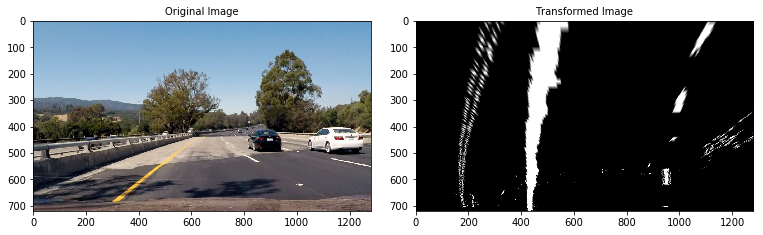

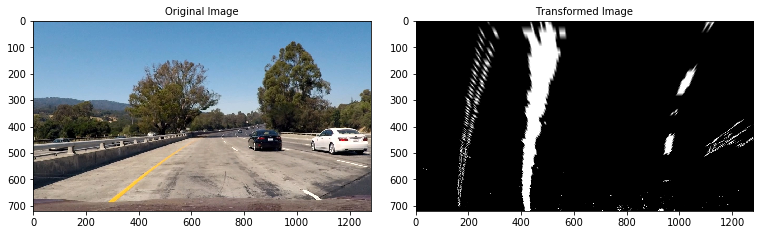

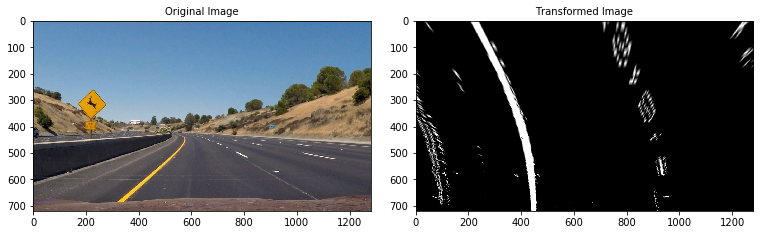

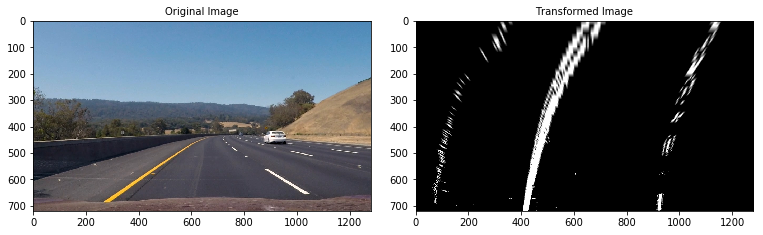

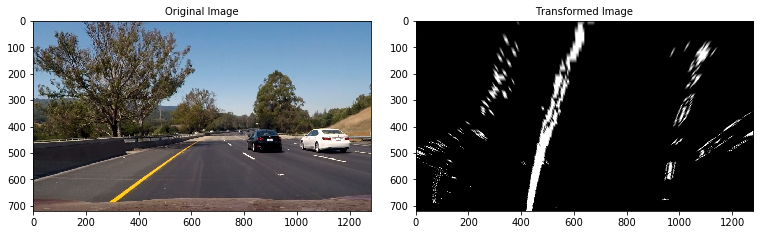

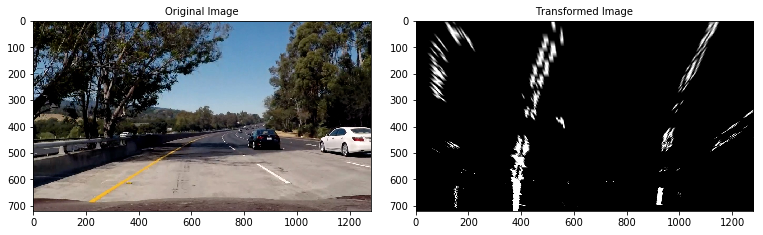

In [11]:
for fname in files:
    if(fname.startswith('test')):
        # Read the image
        img = plt.imread('test_images/'+fname)
        
        # Check the warped images
        transformed = cv2.imread('output_images/Birds-eyeView/'+fname, 0)
        
        #Display original image and transformed image side by side
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=10)
        ax2.imshow(transformed, cmap='gray')
        ax2.set_title('Transformed Image', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

<b>Sliding Window Images</b>

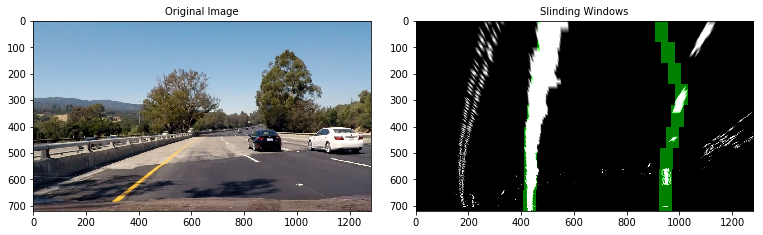

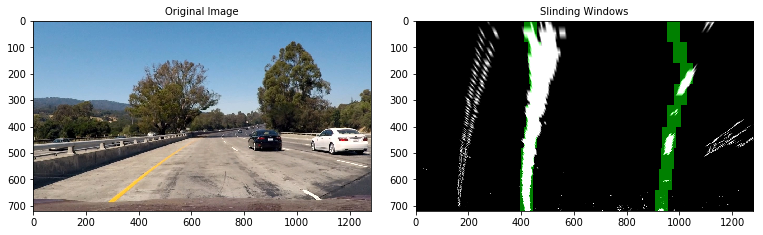

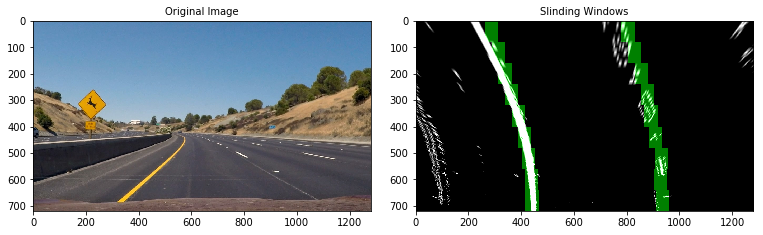

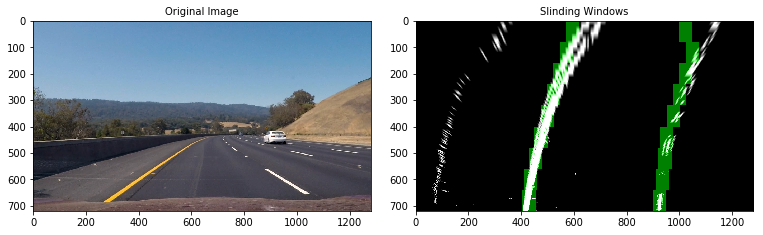

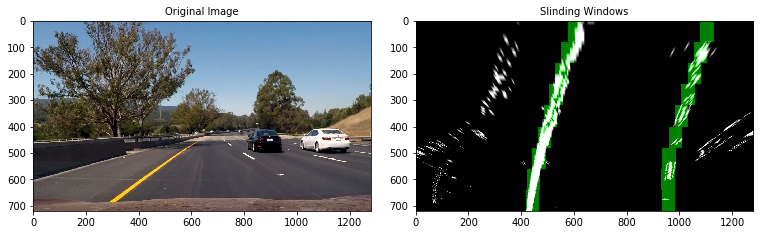

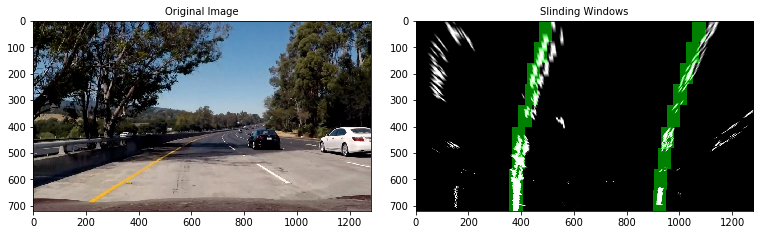

In [12]:
for fname in files:
    if(fname.startswith('test')):
        # Read the image
        img = plt.imread('test_images/'+fname)
        
        # Check the Slinding Window images
        sliding = plt.imread('output_images/SlidingWindows/'+fname)
        
        #Display original image and images with sliding windows side by side
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=10)
        ax2.imshow(sliding, cmap='gray')
        ax2.set_title('Slinding Windows', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

<b>Images with fitted Lane Lines</b>

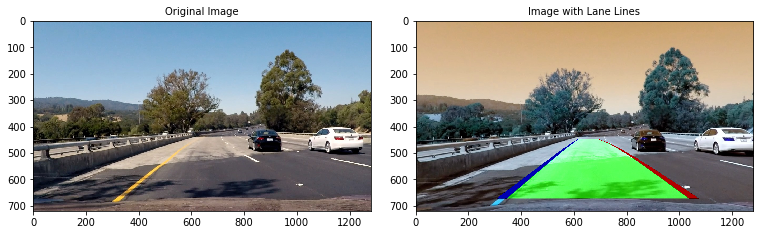

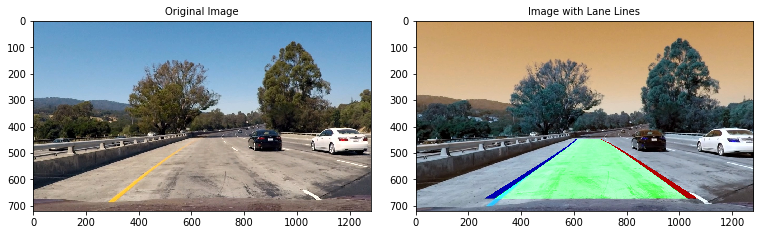

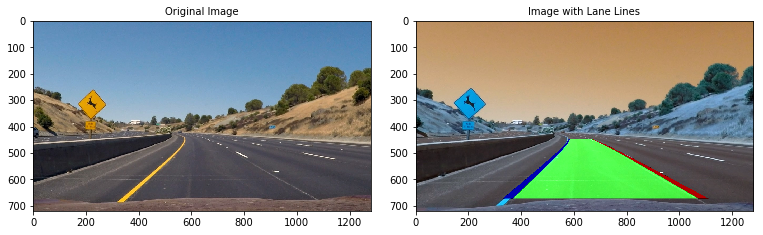

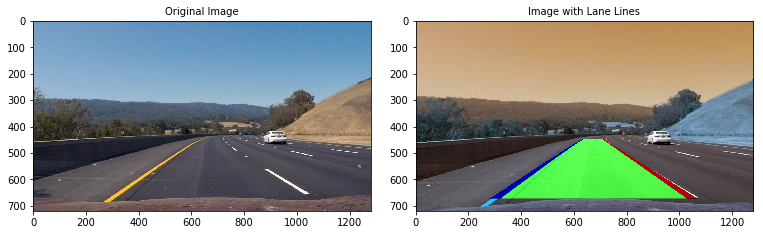

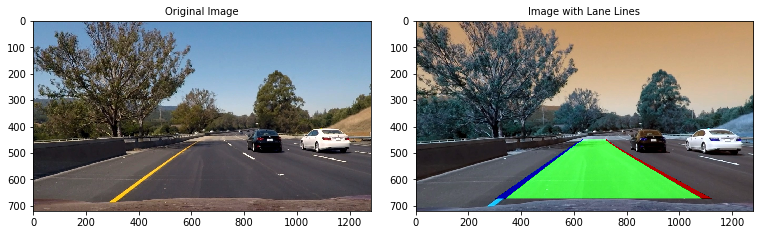

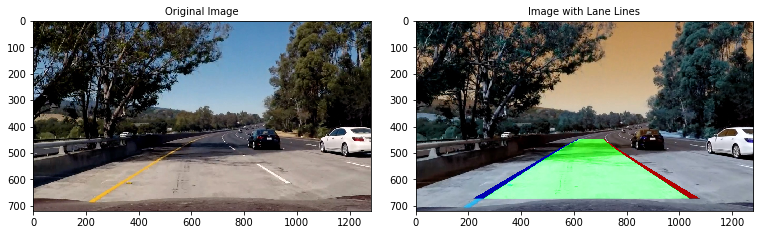

In [13]:
for fname in files:
    if(fname.startswith('test')):
        # Read the image
        img = plt.imread('test_images/'+fname)
        
        # Check the binary images
        lanelines = cv2.imread('output_images/LaneLines/'+fname)
        
        #Display original image and undistorted image side by side
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=10)
        ax2.imshow(lanelines)
        ax2.set_title('Image with Lane Lines', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

<b>Images with Curvature displayed</b>

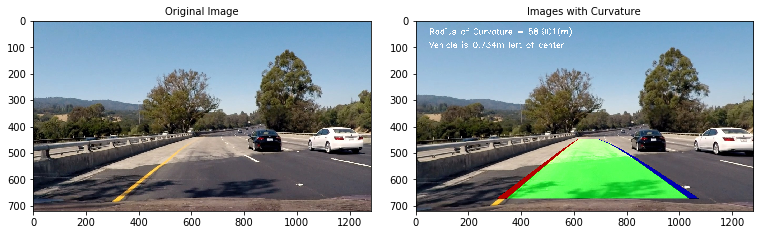

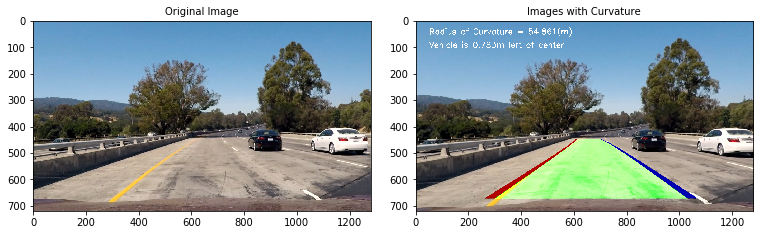

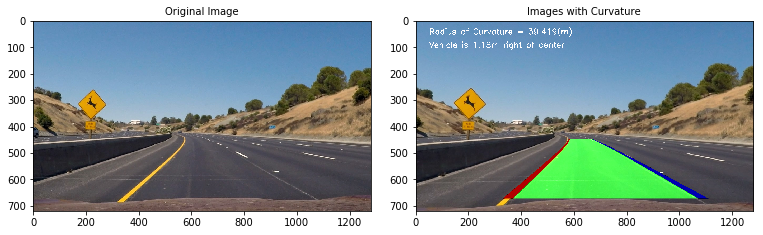

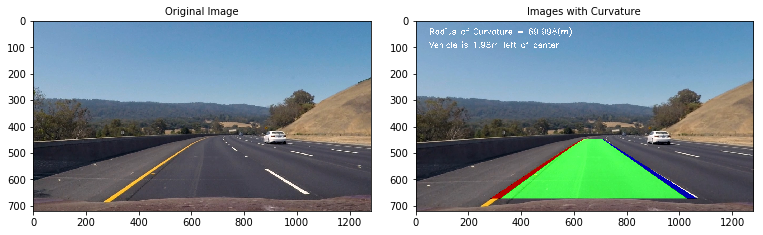

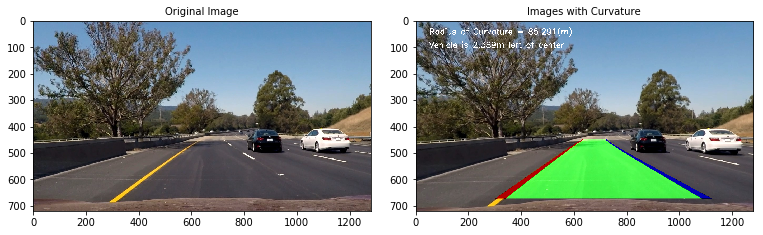

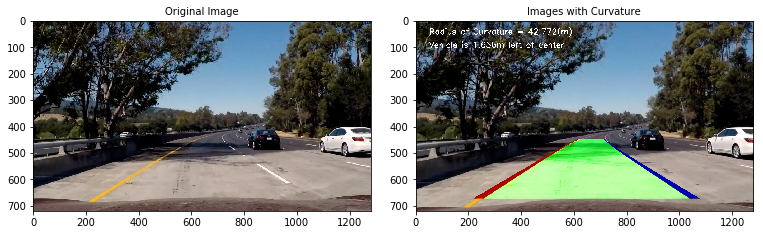

In [14]:
for fname in files:
    if(fname.startswith('test')):
        # Read the image
        img = plt.imread('test_images/'+fname)
        
        # Check the binary images
        curve = plt.imread('output_images/Curvature/'+fname)
        
        #Display original image and undistorted image side by side
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=10)
        ax2.imshow(curve, cmap='gray')
        ax2.set_title('Images with Curvature', fontsize=10)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 

### Modify the pipeline and apply to the video

In [15]:
def process_image(img):
    img = cv2.undistort(img, mtx, dist, None, mtx)
        
    #apply thresholds on gradients and color and combine them to generate binary image
    gradx_binary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady_binary = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
    c_binary = color_threshold(img, sthresh=(100,255), vthresh=(50,255))
    combined_binary = np.zeros_like(img[:,:,0])
    combined_binary[(gradx_binary == 1) & (grady_binary == 1) | (c_binary == 1)] = 255
    
    #Perspective transformation of the image to bird's-eye view
    bot_width = .76
    mid_width = .08
    height_pct = .62
    bottom_trim = .935
    img_size = (img.shape[1], img.shape[0])
    offset = img_size[0]*.25
    #src = np.float32([[(203,720)],[(1099,720)],[(707,463)],[(580,463)]])
    src = np.float32([[img.shape[1]*(.5-mid_width/2), img.shape[0]*height_pct],\
                           [img.shape[1]*(.5+mid_width/2),img.shape[0]*height_pct],\
                           [img.shape[1]*(.5+bot_width/2),img.shape[0]*bottom_trim],\
                           [img.shape[1]*(.5-bot_width/2),img.shape[0]*bottom_trim]])
    des = np.float32([[offset,0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    M = cv2.getPerspectiveTransform(src, des)
    Minv = cv2.getPerspectiveTransform(des, src) # reverse transformation for later use
    warped = cv2.warpPerspective(combined_binary, M, img_size, flags=cv2.INTER_LINEAR)
    
    #Finding pixels using convolving sliding windows
    width = 25
    height = 80
    ym = 10/720
    xm = 4/384
    
    recent_centers = []
    window_centroids = find_window_centroids(warped, width, height, ym, xm, margin = 25, smooth_factor=15)
    
    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    # Points used to find the left and right lanes
    rightx = []
    leftx = []
    
    # Go through each level and draw the windows
    for level in range(0, len(window_centroids)):
        #window_mask is a function to draw window areas
        l_mask = window_mask(width, height, warped, window_centroids[level][0], level)
        r_mask = window_mask(width, height, warped, window_centroids[level][1], level)
        
        leftx.append(window_centroids[level][0])
        rightx.append(window_centroids[level][1])
        
        l_points[(l_points == 255) | ((l_mask == 1))] = 255
        r_points[(r_points == 255) | ((r_mask == 1))] = 255
    
    #Draw the results
    template = np.array(r_points+l_points, np.uint8)
    zero_channel = np.zeros_like(template)
    template = np.array(cv2.merge((zero_channel, template, zero_channel)), np.uint8)
    warpage = np.array(cv2.merge((warped,warped,warped)), np.uint8)
    result = cv2.addWeighted(warpage, 1, template, 0.5, 0.0)
    
    #Fitting lines
    yvals = range(0, warped.shape[0])
    res_yvals = np.arange(warped.shape[0]-(height/2),0,-height)
    
    left_fit = np.polyfit(res_yvals, leftx, 2)
    left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
    left_fitx = np.array(left_fitx, np.int32)
    
    right_fit = np.polyfit(res_yvals, rightx, 2)
    right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
    right_fitx = np.array(right_fitx, np.int32)
    
    left_lane=np.array(list(zip(np.concatenate((left_fitx-width/2,left_fitx[::-1]+width/2), axis=0), np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
    right_lane=np.array(list(zip(np.concatenate((right_fitx-width/2,right_fitx[::-1]+width/2), axis=0), np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
    inner_lane=np.array(list(zip(np.concatenate((left_fitx+width/2,right_fitx[::-1]-width/2), axis=0), np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
    
    road = np.zeros_like(img)
    road_bkg = np.zeros_like(img)
    cv2.fillPoly(road,[left_lane], color=[255,0,0])
    cv2.fillPoly(road,[right_lane], color=[0,0,255])
    cv2.fillPoly(road,[inner_lane], color=[0,255,0])
    cv2.fillPoly(road_bkg,[left_lane], color=[255,255,255])
    cv2.fillPoly(road_bkg,[right_lane], color=[255,255,255])
    
    Minv = cv2.getPerspectiveTransform(des, src)
    road_warped = cv2.warpPerspective(road, Minv, img_size, flags=cv2.INTER_LINEAR)
    road_warped_bkg = cv2.warpPerspective(road_bkg, Minv, img_size, flags=cv2.INTER_LINEAR)
    
    base = cv2.addWeighted(img, 1.0, road_warped_bkg, -1.0, 0.0)
    result = cv2.addWeighted(base, 1.0, road_warped, 0.7, 0.0)
    
    ym_per_pix = ym
    xm_per_pix = xm
    
    curve_fit_cr = np.polyfit(np.array(res_yvals,np.float32)*ym_per_pix, np.array(leftx,np.float32)*xm_per_pix, 2)
    curverad = ((1 + (2*curve_fit_cr[0]*yvals[-1]*ym_per_pix + curve_fit_cr[1])**2)**1.5) / np.absolute(2*curve_fit_cr[0])
    
    #Calculate the offset of the center
    camera_center = (left_fit[-1] + right_fit[-1])/2
    center_diff = (camera_center - warped.shape[1]/2)*xm_per_pix
    side_pos='left'
    if(center_diff <= 0):
        side_pos='right'
    
    #Draw the text showing curvature, offset and speed
    cv2.putText(result, 'Radius of Curvature = '+str(round(curverad, 3))+'(m)',(50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(result, 'Vehicle is '+str(abs(round(center_diff,3)))+'m '+side_pos+' of center',(50,100), cv2.FONT_HERSHEY_SIMPLEX,1, (255,255,255),2)
    return result

In [16]:
#Applying pipeline to the video
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output_video = 'output_tracked.mp4'
input_video = 'project_video.mp4'

clip1 = VideoFileClip(input_video)
video_clip = clip1.fl_image(process_image)
video_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_tracked.mp4
[MoviePy] Writing video output_tracked.mp4


100%|█████████▉| 1260/1261 [06:20<00:00,  3.34it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_tracked.mp4 



### Writeup

Writeup is given in a file placed in <b>./writeup.md</b>